<a href="https://colab.research.google.com/github/bmd94/Bank_Marketing_Prediction/blob/main/Bank_Marketing_Freelace_sar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import data from kaggle

In [ ]:
!pip install -q kaggle

In [ ]:
# creeation d'un dossier kaggle
!mkdir ~/.kaggle/

In [ ]:
# copier kaggle.json dans le dossier kaggle 
!cp '/content/drive/MyDrive/Kaggle/kaggle.json' ~/.kaggle/

In [ ]:
# donner les droits a kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d ruthgn/bank-marketing-data-set

  0% 0.00/282k [00:00<?, ?B/s]
100% 282k/282k [00:00<00:00, 37.5MB/s]


In [ ]:
!unzip /content/bank-marketing-data-set.zip

Archive:  /content/bank-marketing-data-set.zip
  inflating: bank-direct-marketing-campaigns.csv  


# import libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow import keras
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

# Load data

In [ ]:
 data = pd.read_csv('/content/bank-direct-marketing-campaigns.csv', sep=',')

In [ ]:
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


# EDA : Exploratory data analysis

In [ ]:
data.shape

(41188, 20)

In [ ]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

There is no null values in dataframe

In [ ]:
# Rename default and poutcome to has_credit_card and prev_outcome 
# (https://archive.ics.uci.edu/ml/datasets/Bank%2BMarketing)

data.rename(columns={'default': 'has_credit_card'}, inplace=True)
data.rename(columns={'poutcome': 'prev_outcome'}, inplace=True)

In [ ]:
# List of categorical columns
categ_features = [col for col in dict(data.dtypes) 
                  if dict(data.dtypes)[col] in ['object']]

# Categorical features and their number of levels
print(data[categ_features].nunique())

job                12
marital             4
education           8
has_credit_card     3
housing             3
loan                3
contact             2
month              10
day_of_week         5
prev_outcome        3
y                   2
dtype: int64


In [ ]:
# List of numerical columns
num_features = data.columns[data.dtypes != 'object']

# Numerical features and their number of levels
print(data[num_features].nunique())

age                78
campaign           42
pdays              27
previous            8
emp.var.rate       10
cons.price.idx     26
cons.conf.idx      26
euribor3m         316
nr.employed        11
dtype: int64


In [ ]:
# Rename numerical columns
# (https://archive.ics.uci.edu/ml/datasets/Bank%2BMarketing)

data.rename(columns={'emp.var.rate': 'emp_var_rate'}, inplace=True)
data.rename(columns={'cons.conf.idx': 'confidence_index'}, inplace=True)
data.rename(columns={'cons.price.idx': 'price_index'}, inplace=True)
data.rename(columns={'euribor3m': 'eur_3month'}, inplace=True)
data.rename(columns={'nr.employed': 'no_of_employees'}, inplace=True)

In [ ]:
data.head()

,age,job,marital,education,has_credit_card,housing,loan,contact,month,day_of_week,campaign,pdays,previous,prev_outcome,emp_var_rate,price_index,confidence_index,eur_3month,no_of_employees,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
# display all categorical values
for col in list(data.columns[data.dtypes == 'object']):
  print('\n',col+' :')
  print(data[col].unique())


 job :
['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']

 marital :
['married' 'single' 'divorced' 'unknown']

 education :
['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']

 has_credit_card :
['no' 'unknown' 'yes']

 housing :
['no' 'yes' 'unknown']

 loan :
['no' 'yes' 'unknown']

 contact :
['telephone' 'cellular']

 month :
['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']

 day_of_week :
['mon' 'tue' 'wed' 'thu' 'fri']

 prev_outcome :
['nonexistent' 'failure' 'success']

 y :
['no' 'yes']


In [ ]:
print("Before cleaning, there are " + str(data.shape[0]) + " rows and " + str(data.shape[1]) + " columns in this dataframe.")

Before cleaning, there are 41188 rows and 20 columns in this dataframe.


In [ ]:
data.duplicated().sum()
print("There are " + str(data.duplicated().sum()) + " duplicated rows in the dataframe.")

There are 1784 duplicated rows in the dataframe.


In [ ]:
data = data.drop_duplicates()
print("After pre-cleaning, there are " + str(data.shape[0]) + " rows and " + str(data.shape[1]) + " columns in this dataframe.")

After pre-cleaning, there are 39404 rows and 20 columns in this dataframe.


## GENERAL DATAFRAME STATISTICS

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,39404.0,40.116105,10.460328,17.000,32.000,38.000,47.000,98.000
campaign,39404.0,2.618744,2.814780,1.000,1.000,2.000,3.000,56.000
pdays,39404.0,960.847097,190.869184,0.000,999.000,999.000,999.000,999.000
previous,39404.0,0.178738,0.503172,0.000,0.000,0.000,0.000,7.000
emp_var_rate,39404.0,0.064067,1.577041,-3.400,-1.800,1.100,1.400,1.400
price_index,39404.0,93.577538,0.583820,92.201,93.075,93.798,93.994,94.767
confidence_index,39404.0,-40.499604,4.644327,-50.800,-42.700,-41.800,-36.400,-26.900
eur_3month,39404.0,3.601243,1.742337,0.634,1.334,4.857,4.961,5.045
no_of_employees,39404.0,5165.986481,72.763866,4963.600,5099.100,5191.000,5228.100,5228.100


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


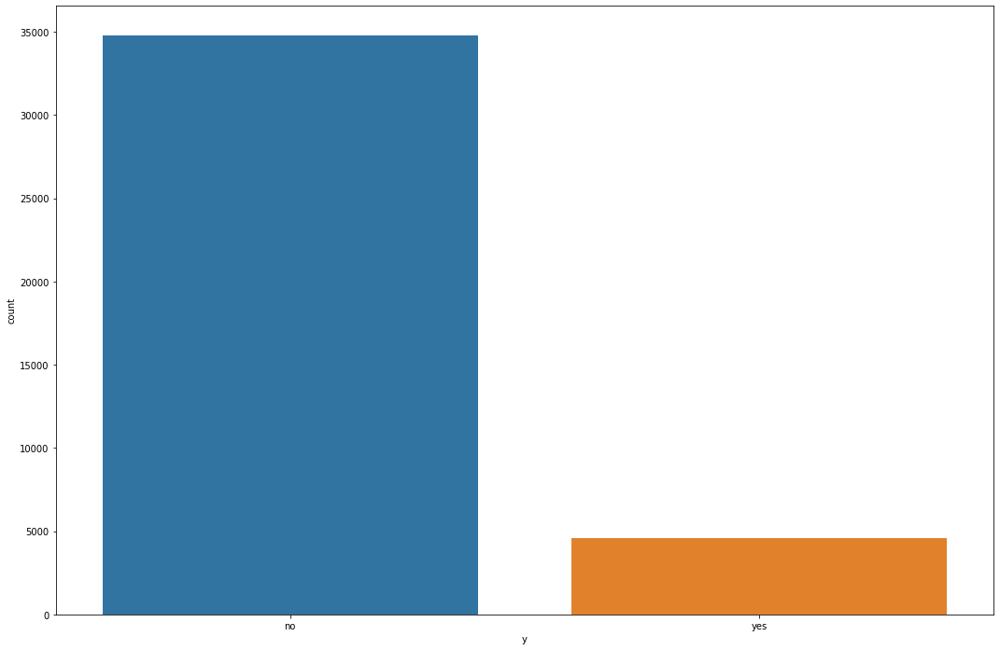

In [ ]:
plt.figure(figsize=(18,12))
sns.countplot(data.y)

We have imbalanced data :'(

Text(0.05, -0.05, '\nObservation:\n \nCampaign seem to be most successful among younger {< 20 years old} and older clients {>60 years old}\n')

findfont: Font family ['San'] not found. Falling back to DejaVu Sans.


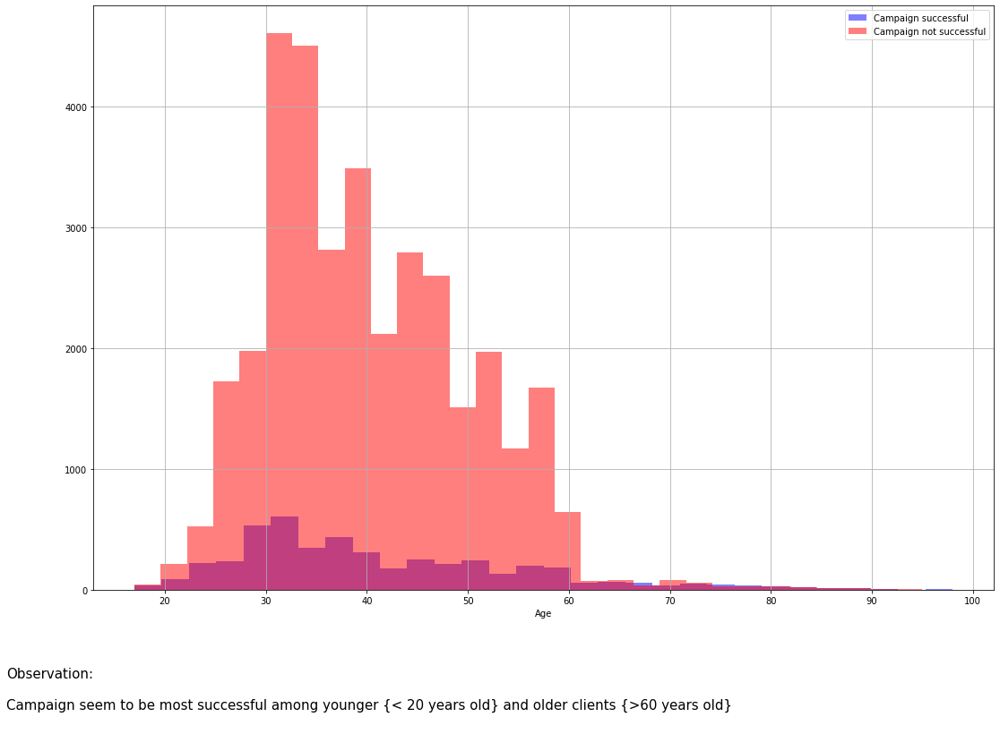

In [ ]:
# Comparing age distribution between converted vs unconverted clients

plt.figure(figsize=(18,12))
data[data['y']=='yes']['age'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Campaign successful')
data[data['y']=='no']['age'].hist(alpha=0.5,color='red',
                                              bins=30,label='Campaign not successful')
plt.legend()
plt.xlabel('Age')

plt.figtext(0.05,-0.05,'''
Observation:\n 
Campaign seem to be most successful among younger {< 20 years old} and older clients {>60 years old}
''', family='San', size=15, ha='left')

In [ ]:
# Mean age by profession
data[['job', 'age']].groupby(by=['job'], axis=0).mean().sort_values(by='age', ascending=True)

,age
job,
student,25.907277
services,37.991055
admin.,38.343361
technician,38.574016
blue-collar,39.574986
unemployed,39.812500
self-employed,39.999278
entrepreneur,41.648399
management,42.397163


Text(0.05, -0.05, '\nObservation:\n \nStudents tend to be younger while retirees are the oldest on average. \n\nNote that there are apparent outliers among both professions (young retirees and older students).\n')

findfont: Font family ['San'] not found. Falling back to DejaVu Sans.


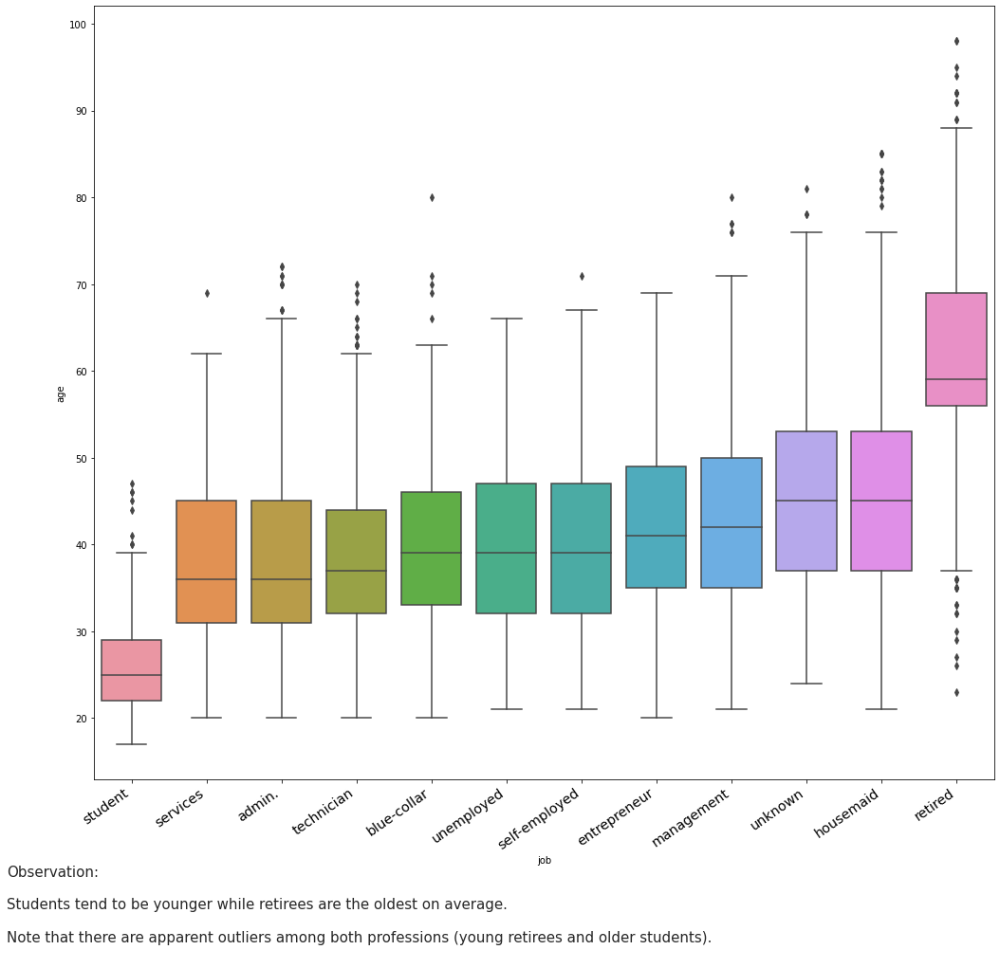

In [ ]:
# Plot age distribution of clients by profession

job_order = data[['job', 'age']].groupby(by=['job'], axis=0).mean().sort_values(by='age', ascending=True).index

plt.figure(figsize=(17, 15))
sns.boxplot(x='job', y='age', data=data, order=job_order)
sns.set(font_scale=1)
plt.xticks(
    rotation=35, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)

plt.figtext(0.05,-0.05,'''
Observation:\n 
Students tend to be younger while retirees are the oldest on average. \n
Note that there are apparent outliers among both professions (young retirees and older students).
''', family='San', size=15, ha='left')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

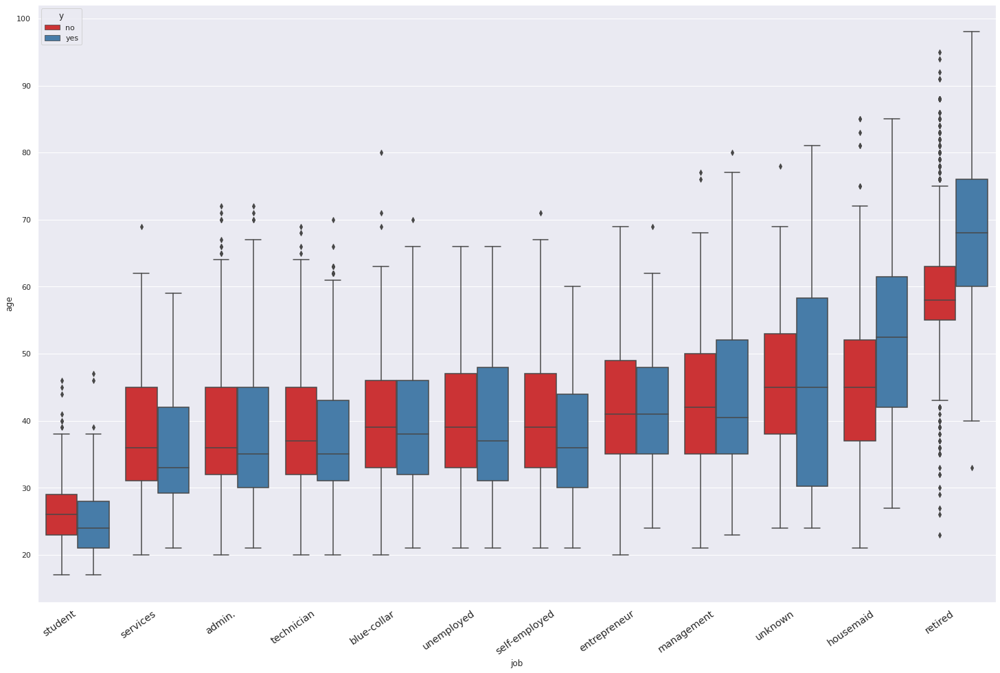

In [ ]:
# Plot age distribution of clients by profession and campaign result

plt.figure(figsize=(25, 16))
sns.boxplot(x='job', y='age', hue='y', data=data, order=job_order, palette="Set1")
sns.set(font_scale=1)
plt.xticks(
    rotation=35, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)

###########################################################
###########  COPY THIS PART AND ADD Observation ###########
                                                ###########
#plt.figtext(0.05,-0.05,'''                     ###########
#Observation:\n                                 ###########
 
# ADD YOUR OBSERVATION HERE
                                                ###########
#''', family='San', size=15, ha='left')         ###########
###########################################################
###########################################################

Text(0.05, -0.05, '\nObservation:\n \nThe proportion of successful of marketing campaigns is higher among students and retirees compared to other professions.\n')

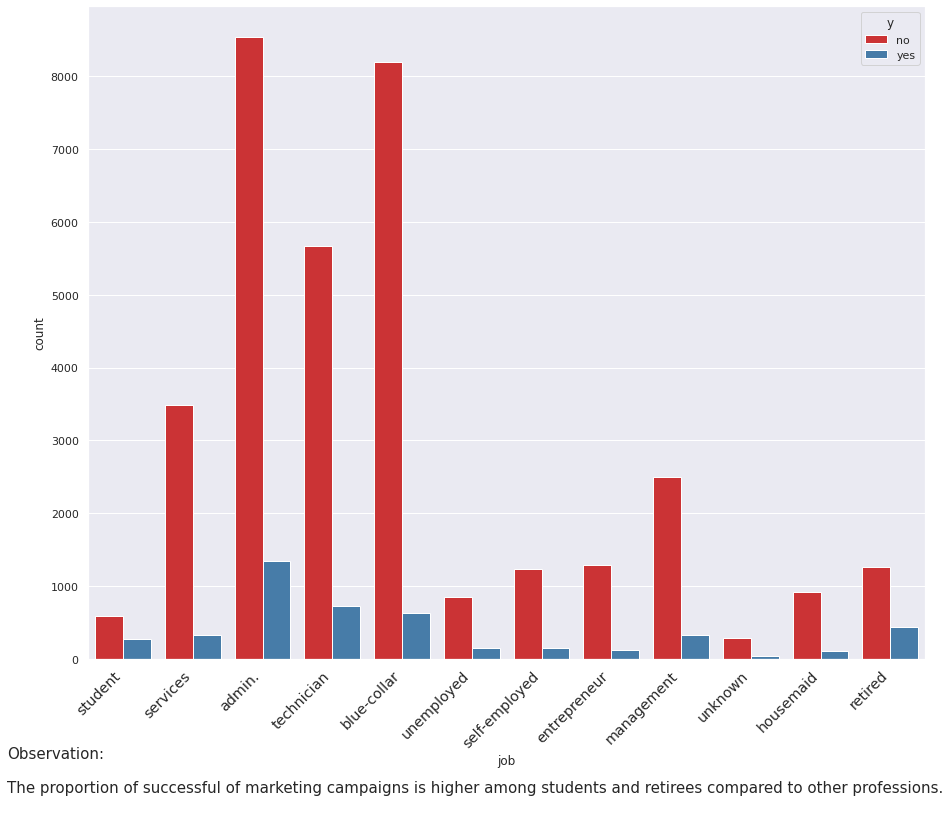

In [ ]:
# Plot count of campaign success by client profession

plt.figure(figsize=(15,12))
sns.set(font_scale=1)
sns.countplot(x='job', hue='y', data=data, palette='Set1', order=job_order)
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)

plt.figtext(0.05,-0.05,'''
Observation:\n 
The proportion of successful of marketing campaigns is higher among students and retirees compared to other professions.
''', family='San', size=15, ha='left')

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

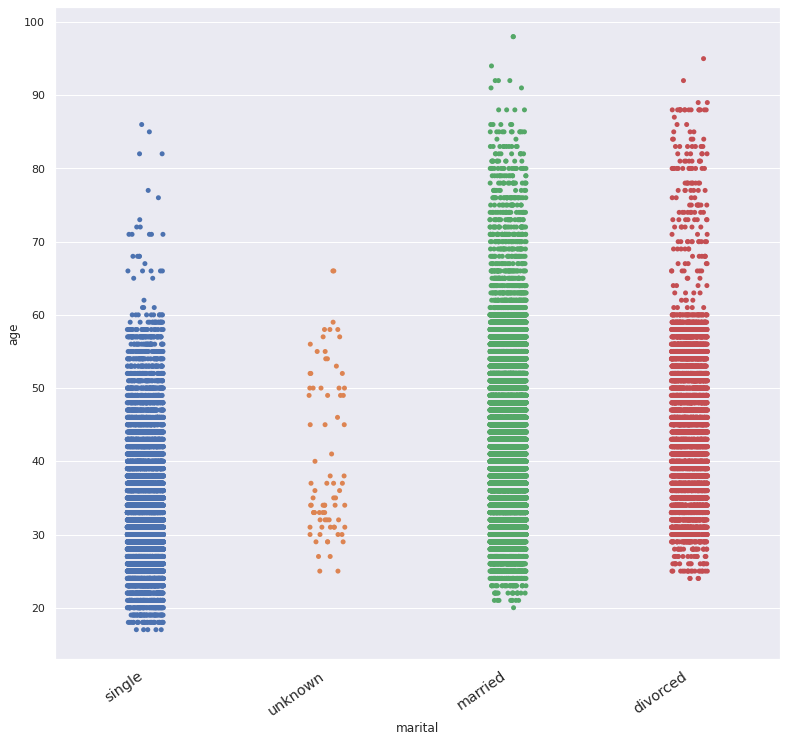

In [ ]:
# Plot age distribution of clients by marital status

marital_order = data[['marital', 'age']].groupby(by=['marital'], axis=0).mean().sort_values(by='age', ascending=True).index

plt.figure(figsize=(13, 12))
sns.stripplot(x='marital', y='age', order=marital_order, data=data)
sns.set(font_scale=1)
plt.xticks(
    rotation=35, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

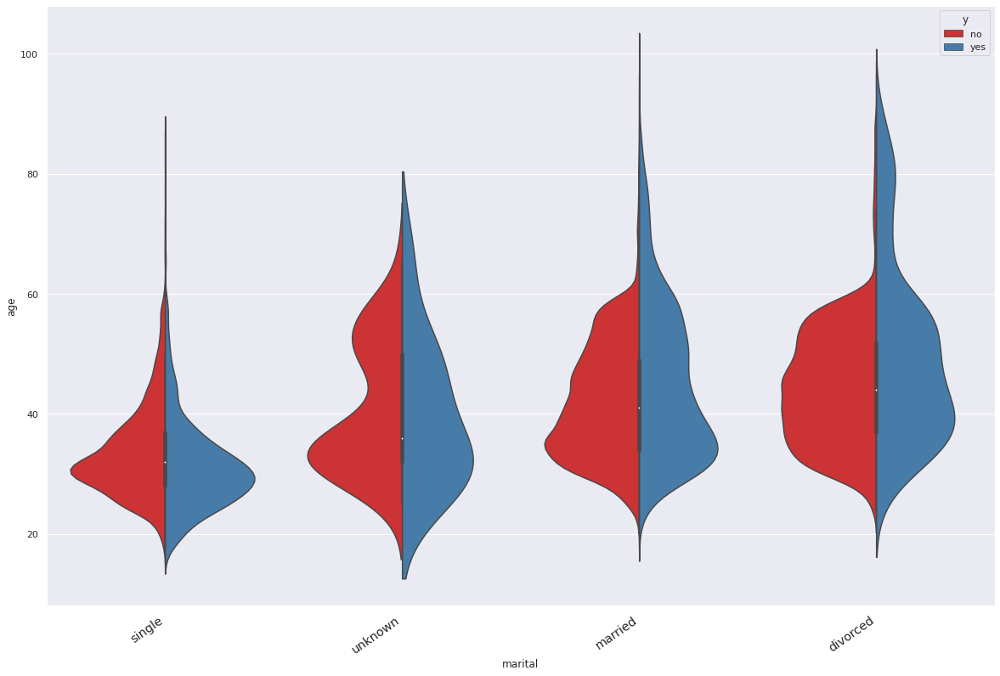

In [ ]:
# Plot age distribution of clients by marital status and campaign result

plt.figure(figsize=(20, 13))
sns.violinplot(x='marital', y='age', hue='y', data=data, split=True, order=marital_order, palette="Set1")
sns.set(font_scale=1)
plt.xticks(
    rotation=35, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

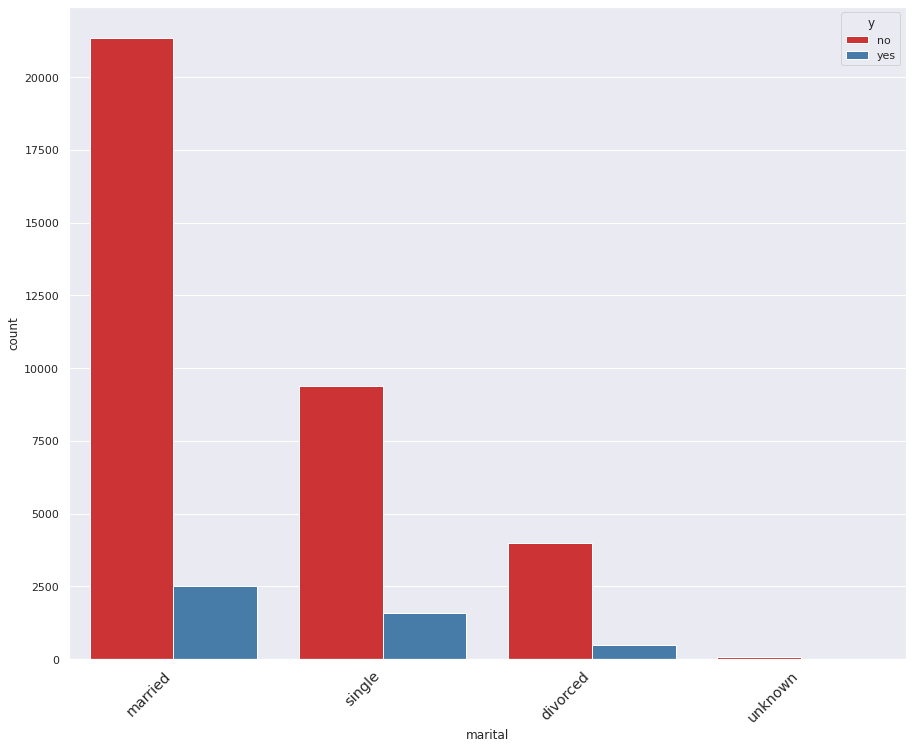

In [ ]:
# Plot count of campaign success by client marital status

plt.figure(figsize=(15,12))
sns.set(font_scale=1)
sns.countplot(x='marital', hue='y', data=data, palette='Set1')
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)

(array([0, 1, 2, 3, 4, 5, 6, 7]), <a list of 8 Text major ticklabel objects>)

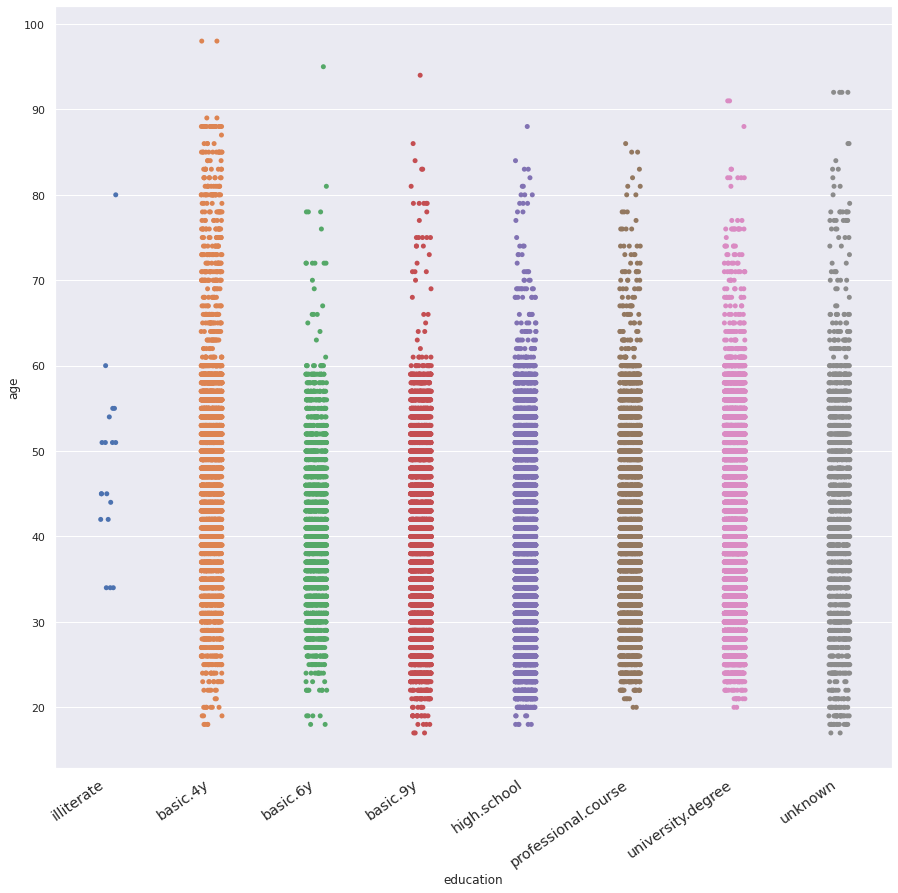

In [ ]:
# Plot age distribution of clients by level of education

education_order = ['illiterate', 'basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'professional.course', 'university.degree', 'unknown']

plt.figure(figsize=(15, 14))
sns.stripplot(x='education', y='age', data=data, order=education_order)
sns.set(font_scale=1)
plt.xticks(
    rotation=35, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)


(array([0, 1, 2, 3, 4, 5, 6, 7]), <a list of 8 Text major ticklabel objects>)

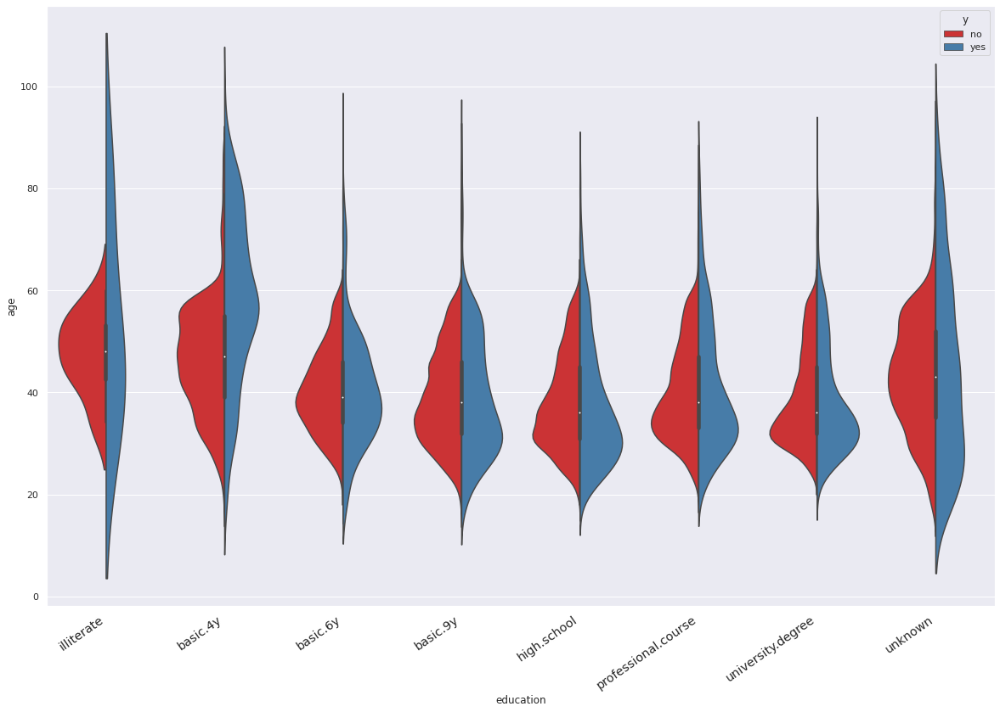

In [ ]:
# Plot age distribution of clients by level of education and campaign result

plt.figure(figsize=(20, 13))
sns.violinplot(x='education', y='age', hue='y', data=data, split=True, order=education_order, palette="Set1")
sns.set(font_scale=1)
plt.xticks(
    rotation=35, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)


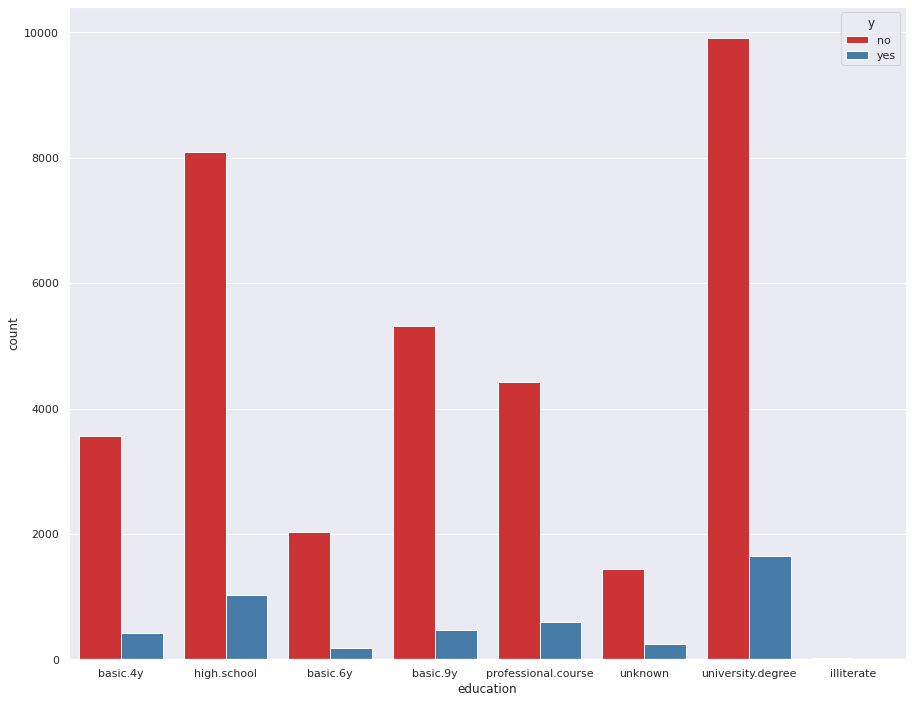

In [ ]:
# Campaign success by client's level of education

plt.figure(figsize=(15,12))
sns.set(font_scale=1)
sns.countplot(x='education', hue='y', data=data, palette='Set1')

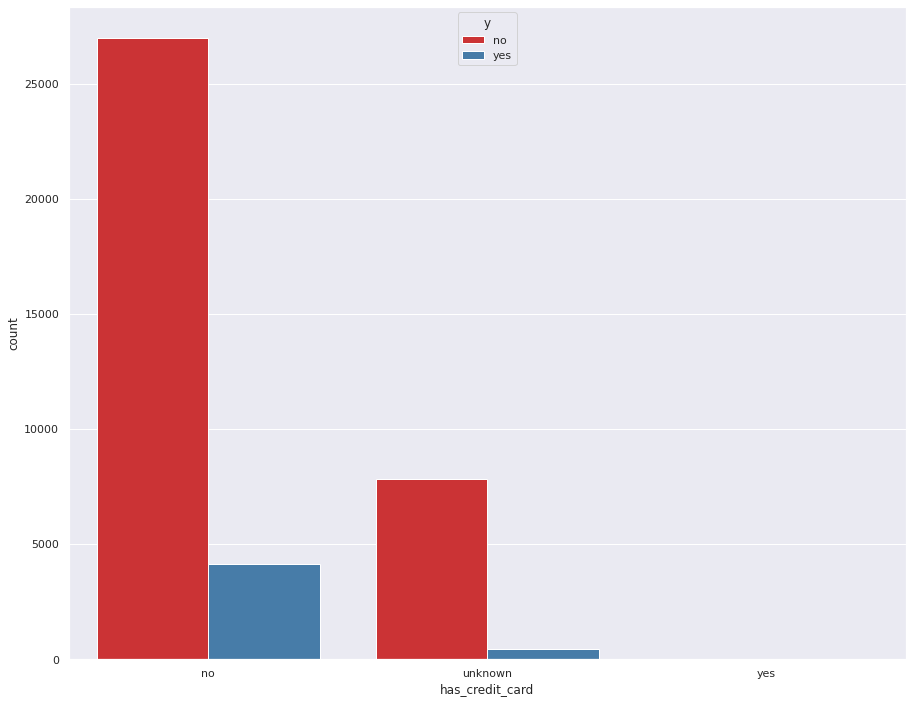

In [ ]:
# Campaign success based on whether client has a credit in default

plt.figure(figsize=(15,12))
sns.set(font_scale=1)
sns.countplot(x='has_credit_card', hue='y', data=data, palette='Set1')

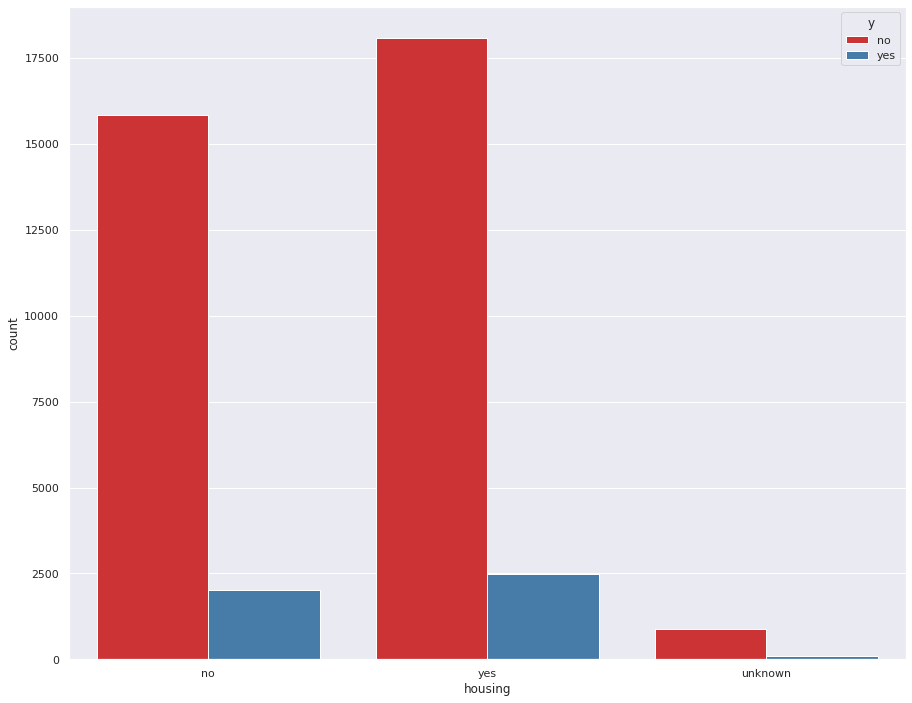

In [ ]:
# Campaign success based on whether client has active housing loan

plt.figure(figsize=(15,12))
sns.set(font_scale=1)
sns.countplot(x='housing', hue='y', data=data, palette='Set1')


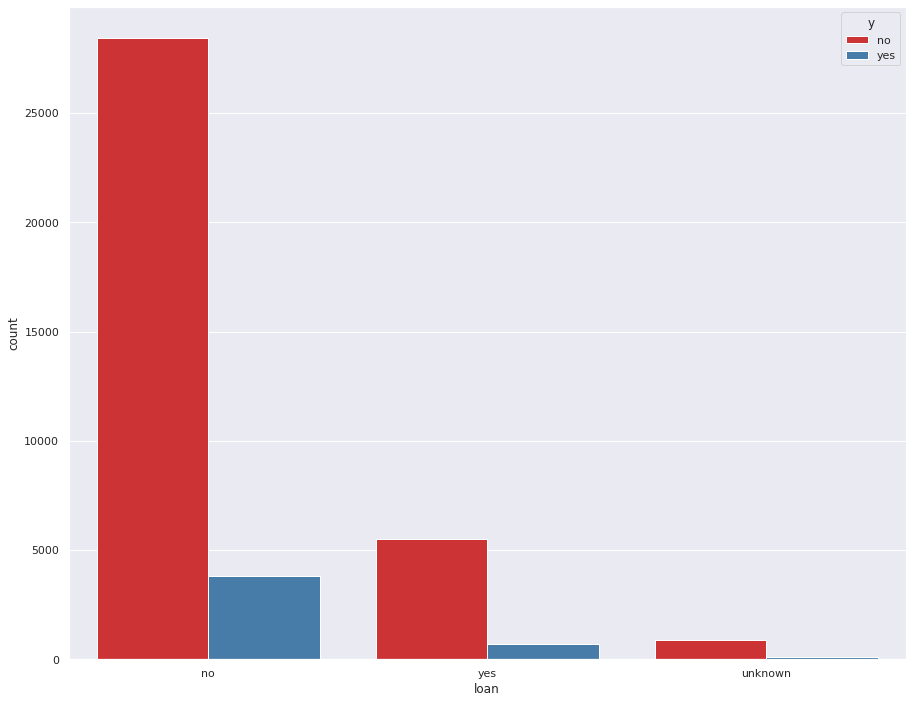

In [ ]:
# Campaign success based on whether client has active personal loan

plt.figure(figsize=(15,12))
sns.set(font_scale=1)
sns.countplot(x='loan', hue='y', data=data, palette='Set1')

Text(0.05, -0.05, '\nObservation:\n \nClients contacted through their cellular phone (as opposed to home telephone) \nseem likelier to respond positively to the direct marketing campaign.\n')

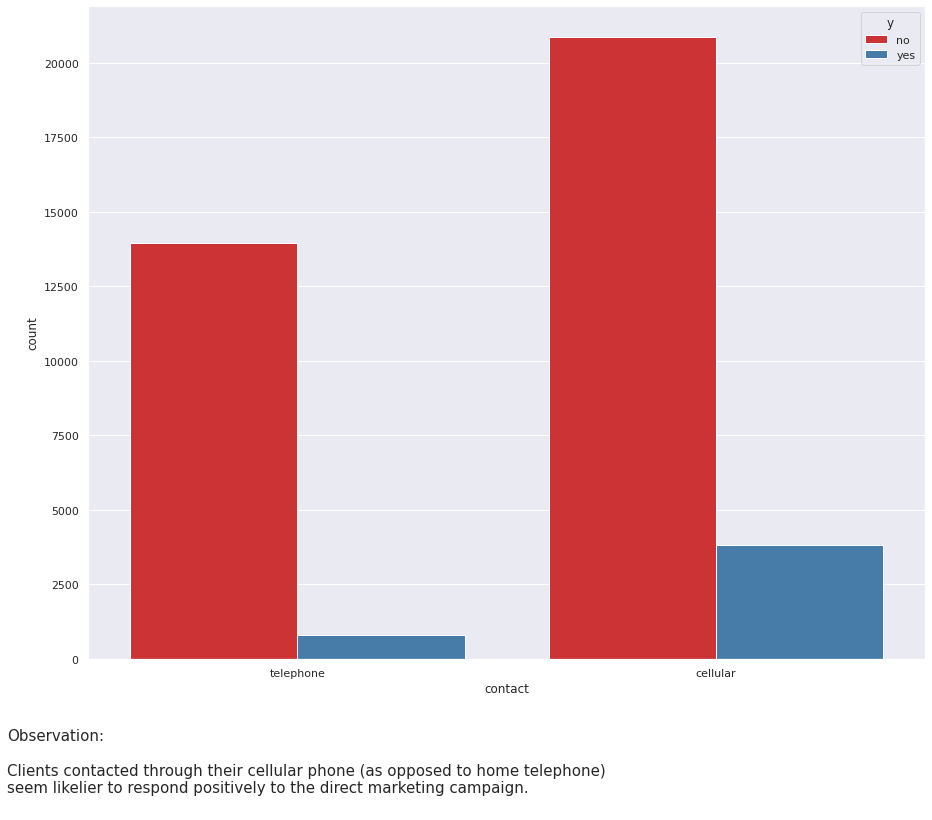

In [ ]:
# Campaign success based on whether client's contact information availability (cellular vs. telephone)

plt.figure(figsize=(15,12))
sns.set(font_scale=1)
sns.countplot(x='contact', hue='y', data=data, palette='Set1')

plt.figtext(0.05,-0.05,'''
Observation:\n 
Clients contacted through their cellular phone (as opposed to home telephone) 
seem likelier to respond positively to the direct marketing campaign.
''', family='San', size=15, ha='left')

Text(0.05, -0.05, '\nObservation:\n \nThe majority of our clients are contacted through their home phones as opposed to their cellular telephone.\n')

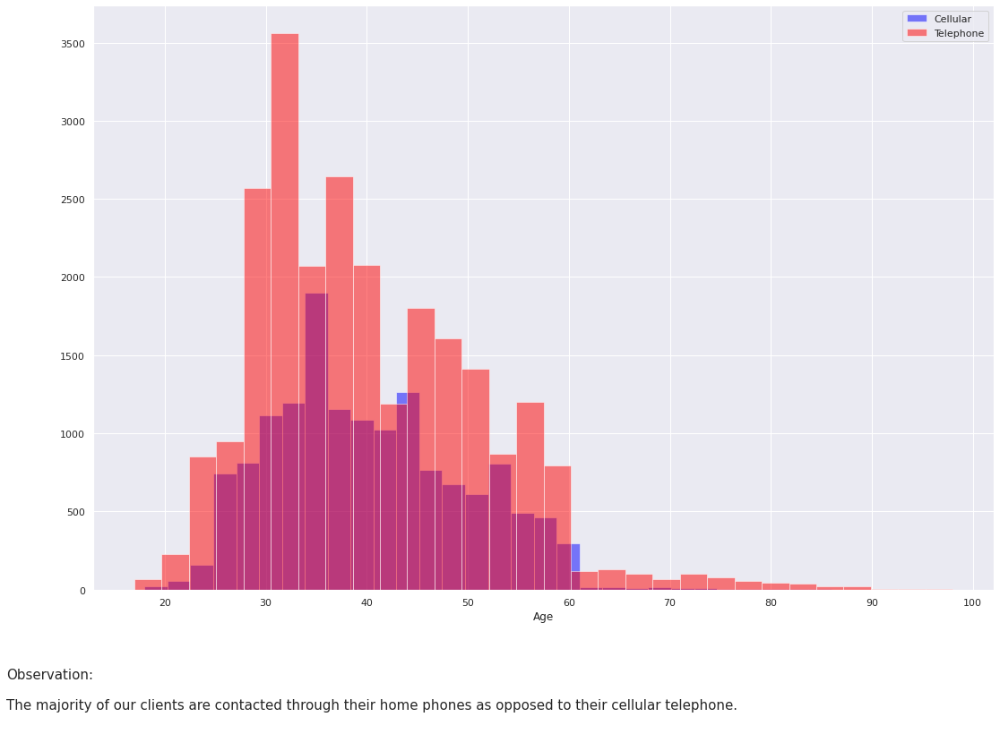

In [ ]:
# Comparing age distribution between clients contacted on cellular vs telephone

plt.figure(figsize=(18,12))
data[data['contact']=='telephone']['age'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Cellular')
data[data['contact']!='telephone']['age'].hist(alpha=0.5,color='red',
                                              bins=30,label='Telephone')
plt.legend()
plt.xlabel('Age')

plt.figtext(0.05,-0.05,'''
Observation:\n 
The majority of our clients are contacted through their home phones as opposed to their cellular telephone.
''', family='San', size=15, ha='left')

Text(0.5, 0, 'employment variation rate')

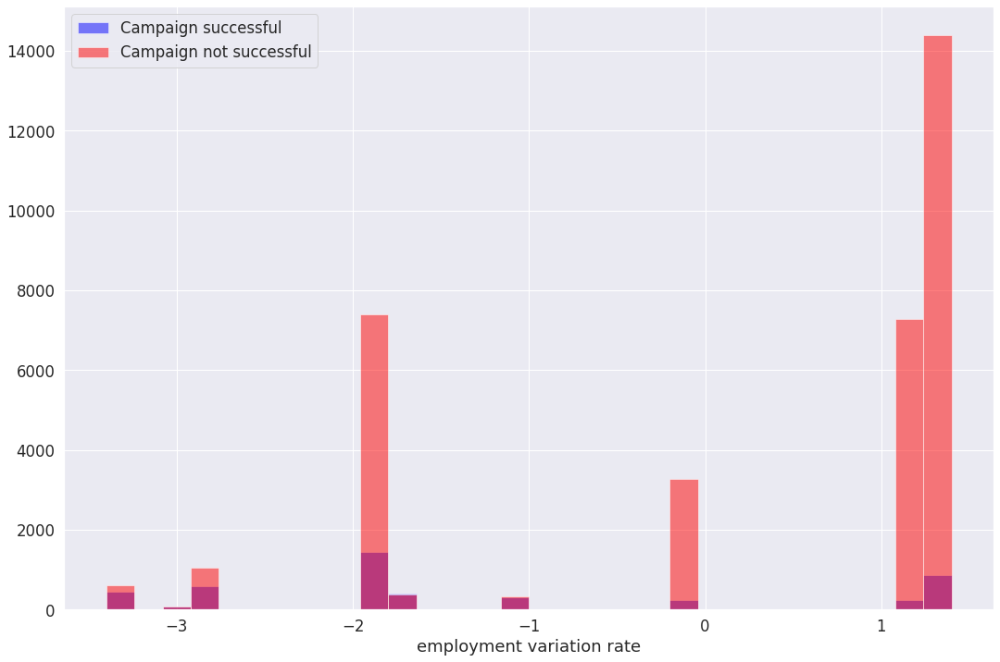

In [ ]:
# Plot Employment Variation Rate

plt.figure(figsize=(18,12))
sns.set(font_scale=1.5)
data[data['y']=='yes']['emp_var_rate'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Campaign successful')
data[data['y']=='no']['emp_var_rate'].hist(alpha=0.5,color='red',
                                              bins=30,label='Campaign not successful')
plt.legend()
plt.xlabel('employment variation rate')

Text(0.5, 0, 'consumer confidence index')

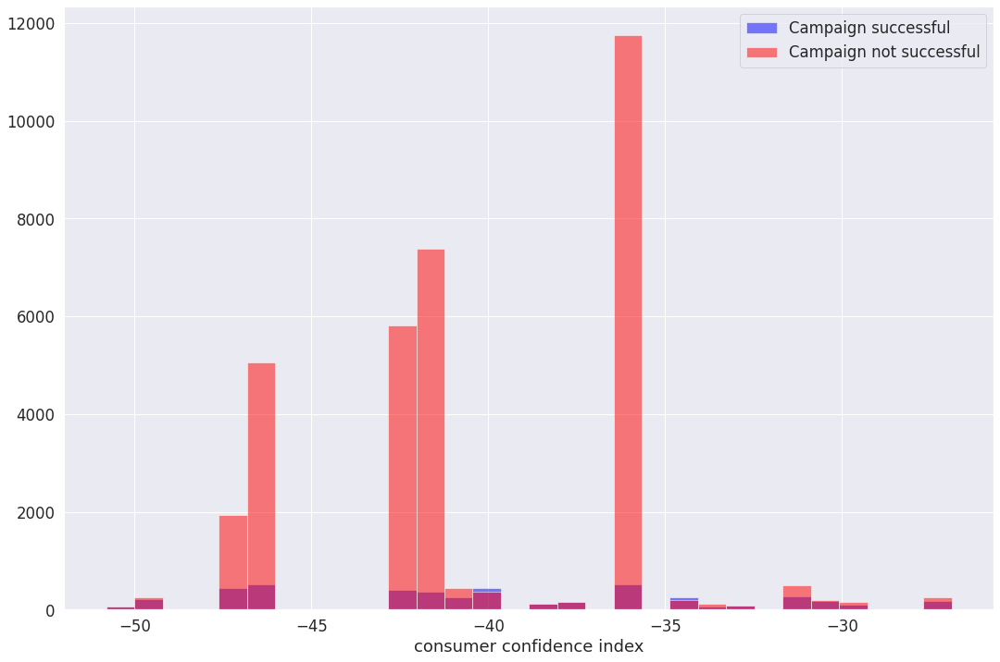

In [ ]:
# Plot Consumer Confidence Index

plt.figure(figsize=(18,12))
sns.set(font_scale=1.5)
data[data['y']=='yes']['confidence_index'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Campaign successful')
data[data['y']=='no']['confidence_index'].hist(alpha=0.5,color='red',
                                              bins=30,label='Campaign not successful')
plt.legend()
plt.xlabel('consumer confidence index')


Text(0.5, 0, 'euribor 3 month rate')

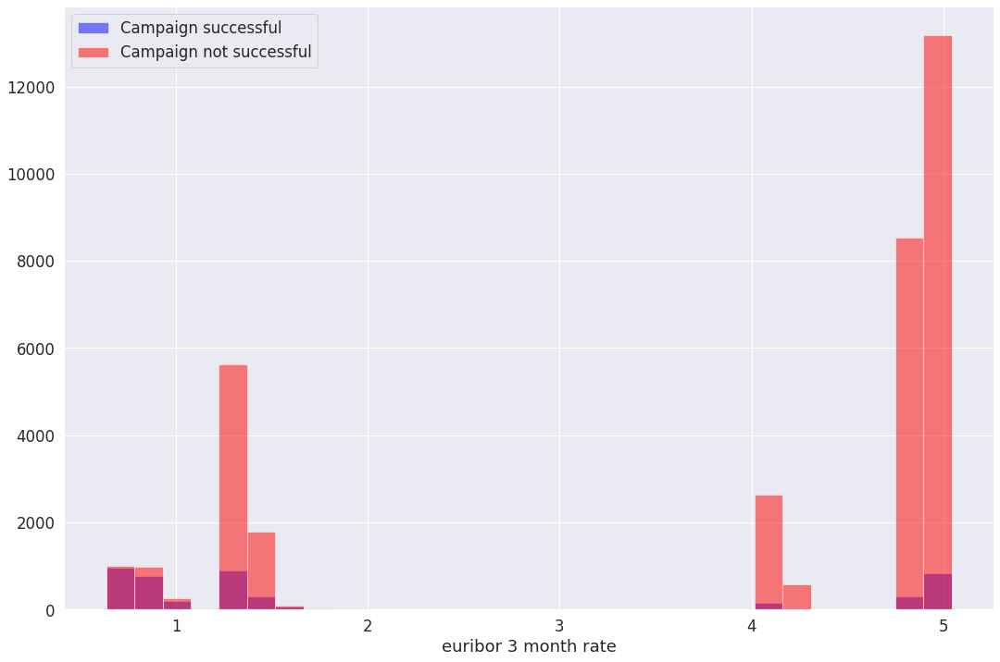

In [ ]:
# Plot Euribor 3 Month Rate


plt.figure(figsize=(18,12))
sns.set(font_scale=1.5)
data[data['y']=='yes']['eur_3month'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Campaign successful')
data[data['y']=='no']['eur_3month'].hist(alpha=0.5,color='red',
                                              bins=30,label='Campaign not successful')
plt.legend()
plt.xlabel('euribor 3 month rate')

Text(0.5, 0, 'number of employees')

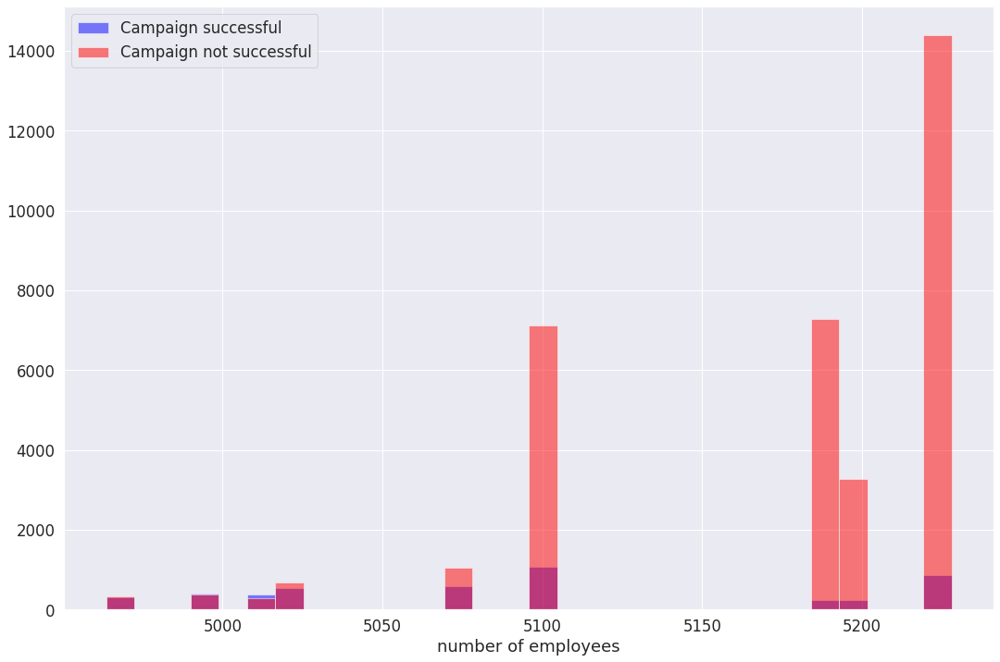

In [ ]:
# Plot Number of Employed People (quarterly indicator)


plt.figure(figsize=(18,12))
sns.set(font_scale=1.5)
data[data['y']=='yes']['no_of_employees'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Campaign successful')
data[data['y']=='no']['no_of_employees'].hist(alpha=0.5,color='red',
                                              bins=30,label='Campaign not successful')
plt.legend()
plt.xlabel('number of employees')

(-1.75, 25.0)

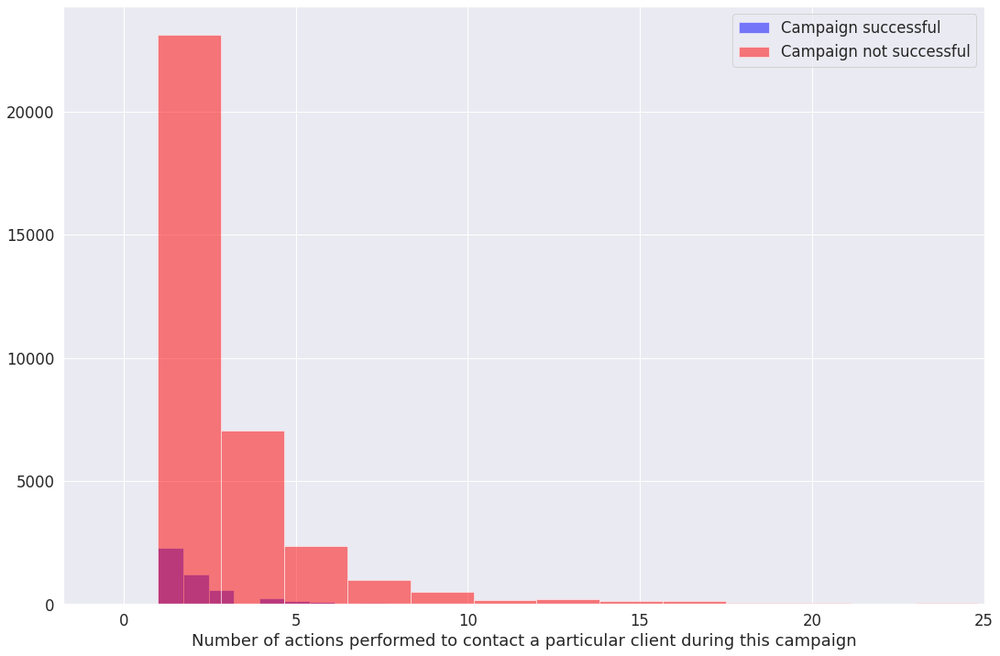

In [ ]:
# Plot `campaign` or number of actions performed to contact a particular client during this campaign


plt.figure(figsize=(18,12))
sns.set(font_scale=1.5)
data[data['y']=='yes']['campaign'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Campaign successful')
data[data['y']=='no']['campaign'].hist(alpha=0.5,color='red',
                                              bins=30,label='Campaign not successful')
plt.legend()
plt.xlabel('Number of actions performed to contact a particular client during this campaign')
plt.xlim(right=25)

(-49.949999999999996, 8.0)

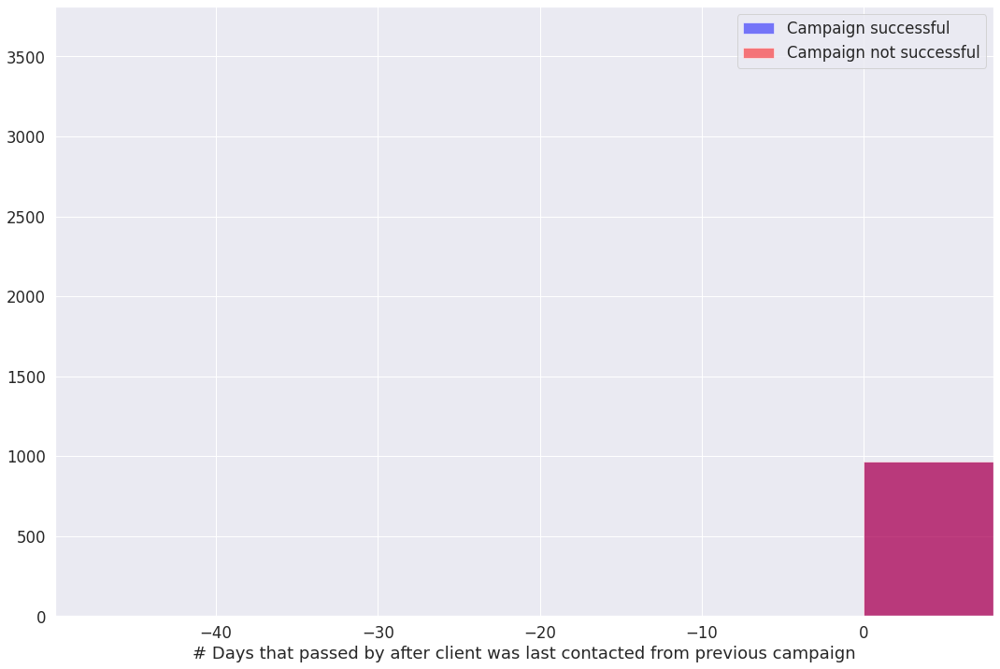

In [ ]:
# Plot `pdays` or number of days that passed by after the client was last contacted from a previous campaign


plt.figure(figsize=(18,12))
sns.set(font_scale=1.5)
data[data['y']=='yes']['pdays'].hist(alpha=0.5,color='blue',
                                              bins=30,label='Campaign successful')
data[data['y']=='yes']['pdays'].hist(alpha=0.5,color='red',
                                              bins=30,label='Campaign not successful')
plt.legend()
plt.xlabel('# Days that passed by after client was last contacted from previous campaign')
plt.xlim(right=8)

Text(0.05, -0.05, '\nObservation:\n \nClients who have responded positively to a past marketing campaign are much likelier to respond postively to current marketing campaign. \n\n')

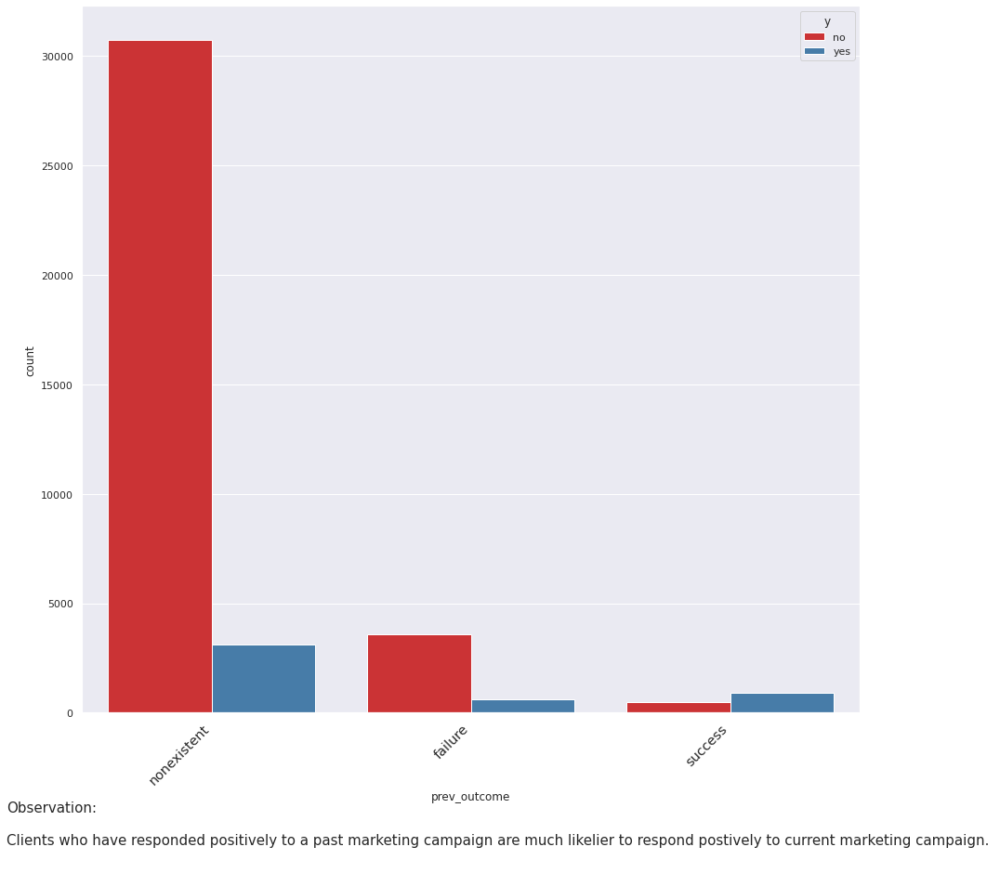

In [ ]:
# Plot campaign success by outcome of previous campaign

plt.figure(figsize=(15,14))
sns.set(font_scale=1)
sns.countplot(x='prev_outcome', hue='y', data=data, palette='Set1')
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)

plt.figtext(0.05,-0.05,'''
Observation:\n 
Clients who have responded positively to a past marketing campaign are much likelier to respond postively to current marketing campaign. \n
''', family='San', size=15, ha='left')

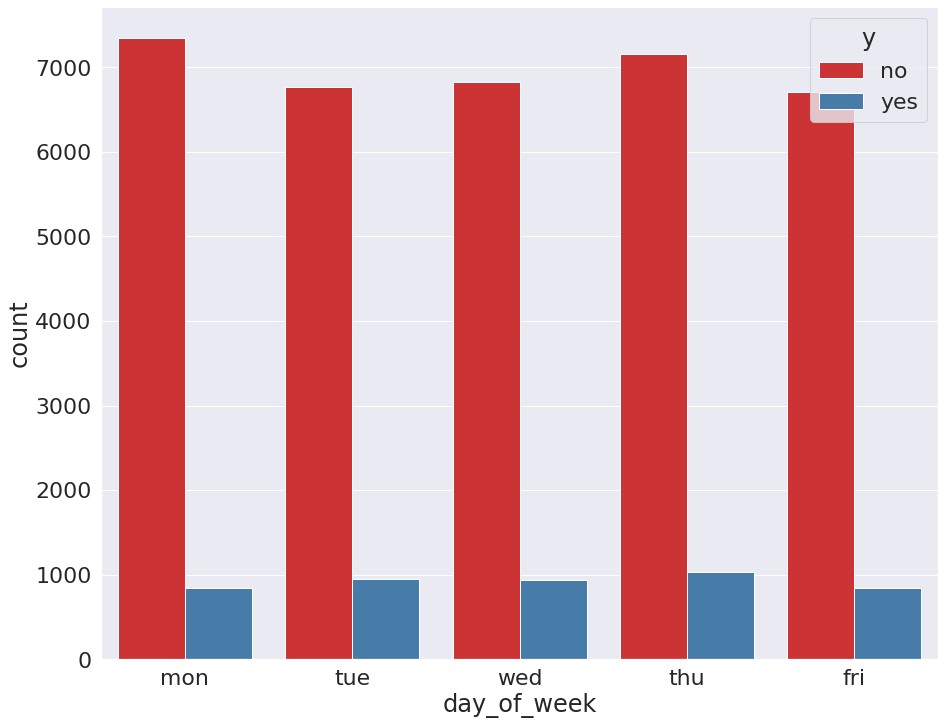

In [ ]:
# Plot campaign success by day of week

plt.figure(figsize=(15,12))
sns.set(font_scale=2)
sns.countplot(x='day_of_week', hue='y', data=data, palette='Set1')

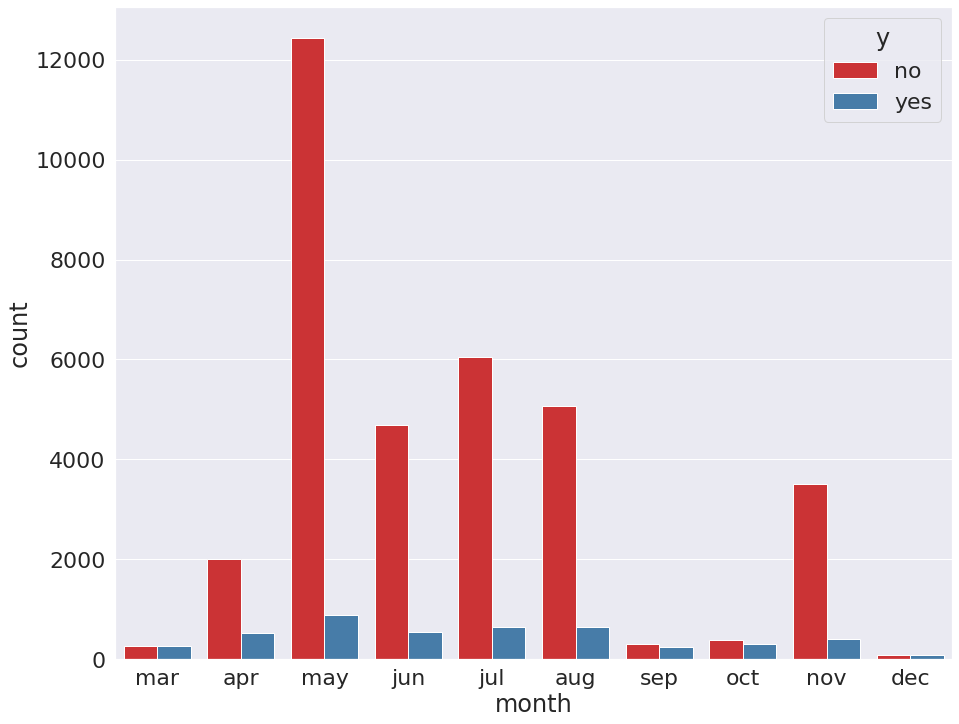

In [ ]:
# Plot campaign success by month

month_order = ['mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

plt.figure(figsize=(15,12))
sns.set(font_scale=2)
sns.countplot(x='month', hue='y', data=data, order = month_order, palette='Set1')


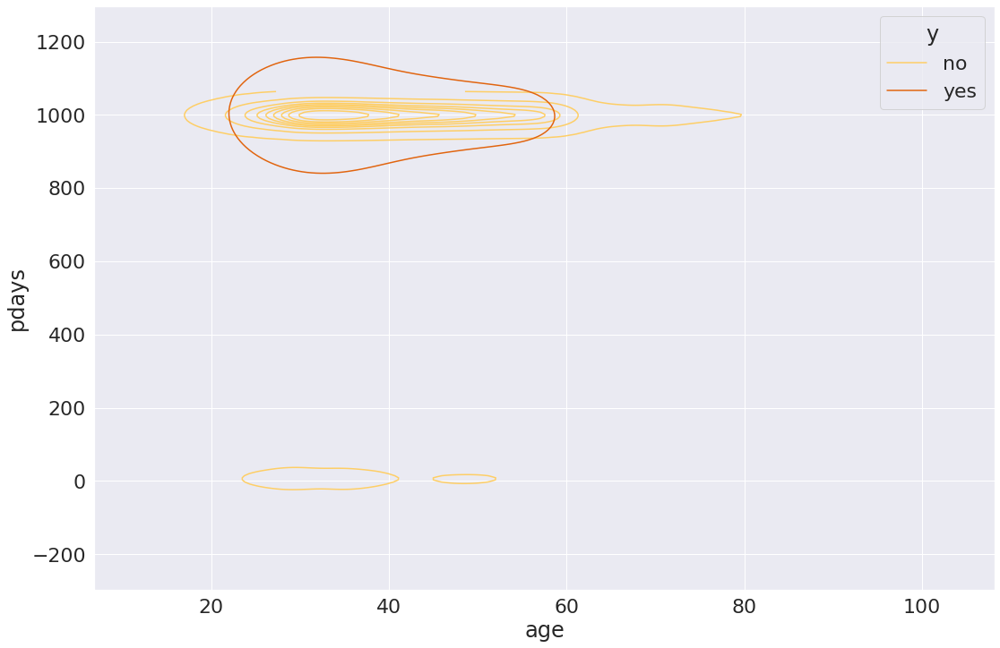

In [ ]:
plt.figure(figsize = (18, 12))
sns.kdeplot(x = data["age"], y = data["pdays"], hue = data["y"], palette = "YlOrBr")

## CORRELATION MATRIX OF DATAFRAME

In [ ]:
data.corr()

,age,campaign,pdays,previous,emp_var_rate,price_index,confidence_index,eur_3month,no_of_employees
age,1.000000,0.000990,-0.033556,0.022051,0.002199,0.000954,0.128851,0.012970,-0.014800
campaign,0.000990,1.000000,0.056527,-0.084663,0.158225,0.128093,-0.014252,0.142438,0.152535
pdays,-0.033556,0.056527,1.000000,-0.588981,0.273821,0.080392,-0.092785,0.300021,0.375664
previous,0.022051,-0.084663,-0.588981,1.000000,-0.422050,-0.203900,-0.049526,-0.456498,-0.503055
emp_var_rate,0.002199,0.158225,0.273821,-0.422050,1.000000,0.776480,0.187151,0.971919,0.905359
price_index,0.000954,0.128093,0.080392,-0.203900,0.776480,1.000000,0.054682,0.687596,0.519677
confidence_index,0.128851,-0.014252,-0.092785,-0.049526,0.187151,0.054682,1.000000,0.270182,0.092497
eur_3month,0.012970,0.142438,0.300021,-0.456498,0.971919,0.687596,0.270182,1.000000,0.944573
no_of_employees,-0.014800,0.152535,0.375664,-0.503055,0.905359,0.519677,0.092497,0.944573,1.000000


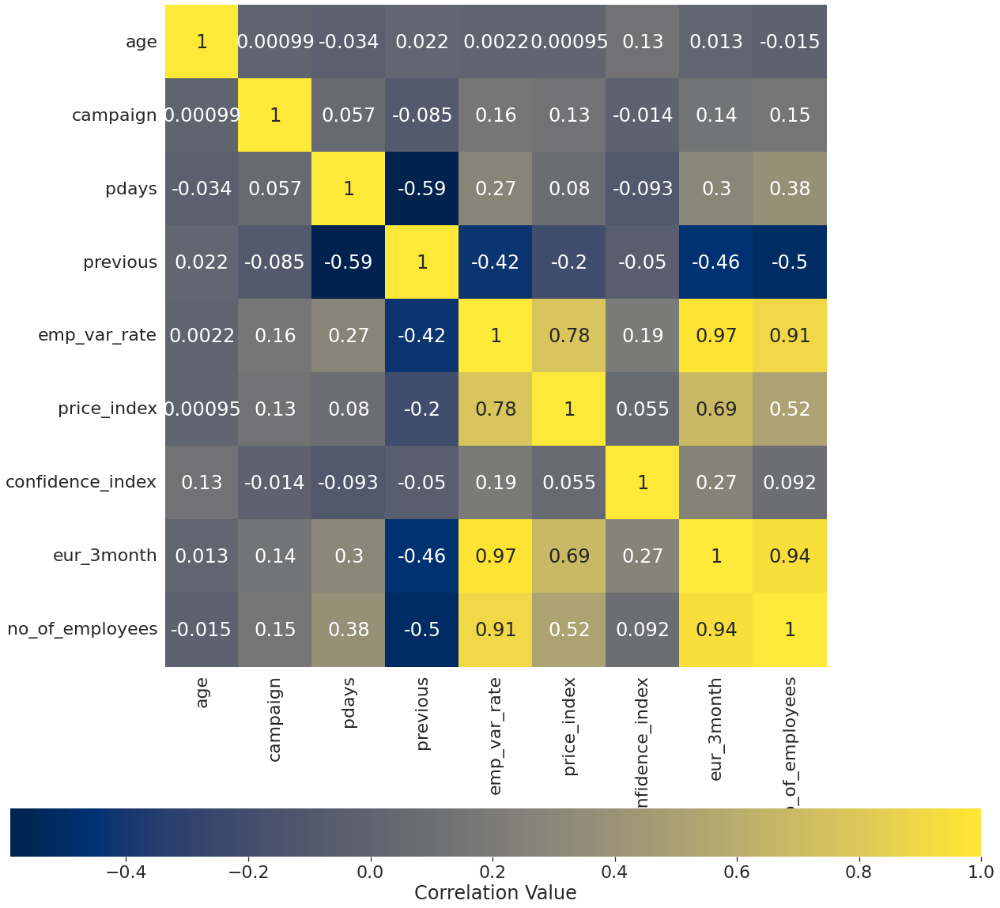

In [ ]:
#cmap = sns.diverging_palette(100, 200, s = 40, l = 65, n = 9)
corrmat = data.corr()
plt.subplots(figsize = (22, 22))
sns.heatmap(corrmat,cmap = "cividis",annot = True, square = True, cbar_kws = {'label': 'Correlation Value', 'orientation': 'horizontal'});

## Outlier Handling

In [ ]:
%%html
<img src='https://miro.medium.com/max/1400/1*2c21SkzJMf3frPXPAR_gZA.png' />

In [ ]:
outliers = []
def detect_outliers_iqr(data):
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    for i in data: 
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers

In [ ]:
# Replace outlier values with median

for col in ['age', 'campaign', 'pdays', 'confidence_index']:
  sample_outliers = detect_outliers_iqr(data[col])
  median = np.median(data[col])
  for i in sample_outliers:
      data[col] = np.where(data[col]==i, median, data[col])

In [ ]:
# List of categorical columns
[col for col in dict(data.dtypes) 
                  if dict(data.dtypes)[col] in ['object']]

['job',
 'marital',
 'education',
 'has_credit_card',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'prev_outcome',
 'y']

In [ ]:
%%html
<img src='https://miro.medium.com/max/1838/1*O_pTwOZZLYZabRjw3Ga21A.png' />

**One-Hot** encoding allows us to turn nominal categorical data into features with numerical values, white not mathematically imply any ordinal relationship between the classes



In [ ]:
# Nominative (unordered) categorical features for one-hot encoding
features_nom = ['job',
   'marital',
   'education',
   'has_credit_card',
   'housing',
   'loan',
   'contact',
   'month',
   'day_of_week',
   'prev_outcome']

def encode(df):
    # Split data for one-hot-encoding
    X = data.drop('y', axis=1)
    y = data['y']
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.33, random_state=1)

    # Apply one-hot encoder to each feature column with categorical data
    OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False, dtype=int)
    OH_cols_train = pd.DataFrame(OH_encoder.fit_transform(X_train[features_nom]))
    OH_cols_valid = pd.DataFrame(OH_encoder.transform(X_valid[features_nom]))

    # One-hot encoding removed index, let's put it back
    OH_cols_train.index = X_train.index
    OH_cols_valid.index = X_valid.index

    # Get appropriate column names for new one-hot encoding
    OH_cols_train.columns = OH_encoder.get_feature_names(features_nom)
    OH_cols_valid.columns = OH_encoder.get_feature_names(features_nom)

    # Remove old categorical columns (to replace with one-hot encoding)
    num_X_train = X_train.drop(features_nom, axis=1)
    num_X_valid = X_valid.drop(features_nom, axis=1)

    # Add one-hot encoded columns to numerical features
    OH_X_train = pd.concat([num_X_train, OH_cols_train], axis=1)
    OH_X_valid = pd.concat([num_X_valid, OH_cols_valid], axis=1)

    # Merge the splits back
    X = pd.concat([OH_X_train, OH_X_valid])
    y = pd.concat([y_train, y_valid])

    # Convert `y` to boolean values
    y = y.map(dict(yes=1, no=0))
 
    # Join `X` and `y` back into one
    df = X.join(y)

    return df

In [ ]:
#data = pd.read_csv('/content/bank-direct-marketing-campaigns.csv', sep=',')
df = encode(data)

In [ ]:
df.columns

Index(['age', 'campaign', 'pdays', 'previous', 'emp_var_rate', 'price_index',
       'confidence_index', 'eur_3month', 'no_of_employees', 'job_admin.',
       'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single',
       'marital_unknown', 'education_basic.4y', 'education_basic.6y',
       'education_basic.9y', 'education_high.school', 'education_illiterate',
       'education_professional.course', 'education_university.degree',
       'education_unknown', 'has_credit_card_no', 'has_credit_card_unknown',
       'has_credit_card_yes', 'housing_no', 'housing_unknown', 'housing_yes',
       'loan_no', 'loan_unknown', 'loan_yes', 'contact_cellular',
       'contact_telephone', 'month_apr', 'month_aug', 'month_dec', 'month_jul',
       'month_jun', 'month_mar', 'month_may', 'mont

In [ ]:
# How much do the other columns correlate with the target column "y"?

y_corr = df.corr()["y"]
y_corr = pd.DataFrame(y_corr)
y_corr

,y
age,-0.022367
campaign,-0.054474
pdays,NaN
previous,0.229706
emp_var_rate,-0.298055
...,...
day_of_week_wed,0.005664
prev_outcome_failure,0.029781
prev_outcome_nonexistent,-0.193174
prev_outcome_success,0.316458


In [ ]:
print("After encoding, there are " + str(df.shape[0]) + " rows and " + str(df.shape[1]) + " columns in this dataframe.")

After encoding, there are 39404 rows and 63 columns in this dataframe.


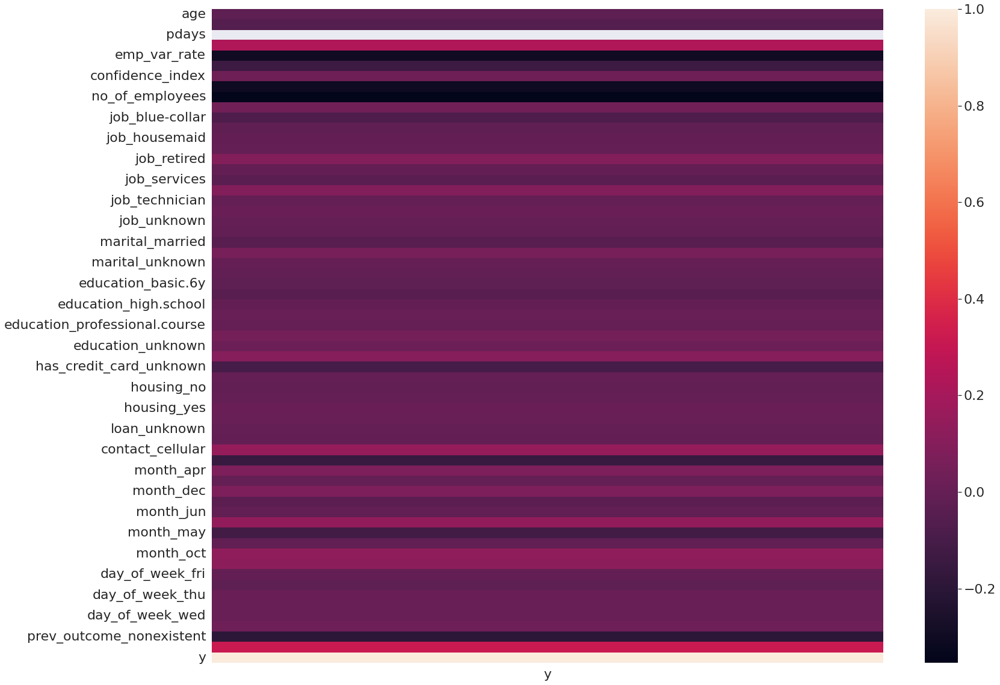

In [ ]:
plt.figure(figsize = (25,20))
sns.heatmap(y_corr)

# Feature Engineering

In [ ]:
def make_mi_scores(X, y):
    X = X.copy()
    # Exclude continous features
    X = X.select_dtypes(exclude=['float'])
    mi_scores = mutual_info_classif(X, y, random_state=1)
    mi_scores = pd.Series(mi_scores, name='MI Scores', index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title('Mutual Information Scores')

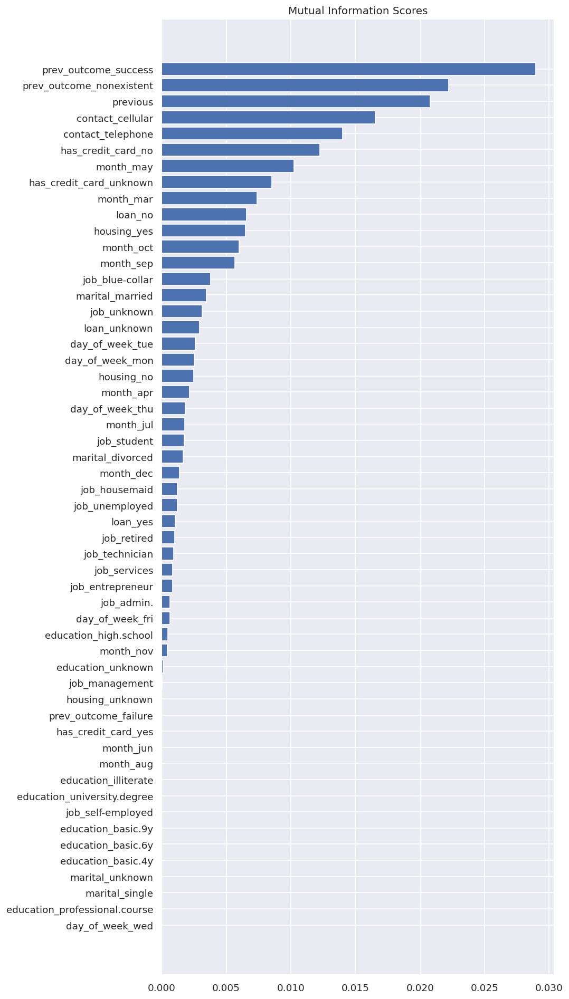

In [ ]:
mi_scores = make_mi_scores(X, y)

# Show Mutual Information (MI) score plot
plt.figure(dpi=120, figsize=(8, 20))
sns.set(font_scale=1)
plot_mi_scores(mi_scores)


We have a number of features that are highly informative and several that don't seem to be informative at all (at least by themselves). We will try dropping features with 0.0 MI scores.

In [ ]:
def drop_low_mi(df, mi_scores):
    low_mi_features = mi_scores[mi_scores==0.0].index
    df = df.drop(low_mi_features, axis=1)
    return df

In [ ]:
df = drop_low_mi(df, mi_scores)
df.shape

(39404, 48)

In [ ]:
X.columns

Index(['age', 'campaign', 'pdays', 'previous', 'emp_var_rate', 'price_index',
       'confidence_index', 'eur_3month', 'no_of_employees', 'job_admin.',
       'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single',
       'marital_unknown', 'education_basic.4y', 'education_basic.6y',
       'education_basic.9y', 'education_high.school', 'education_illiterate',
       'education_professional.course', 'education_university.degree',
       'education_unknown', 'has_credit_card_no', 'has_credit_card_unknown',
       'has_credit_card_yes', 'housing_no', 'housing_unknown', 'housing_yes',
       'loan_no', 'loan_unknown', 'loan_yes', 'contact_cellular',
       'contact_telephone', 'month_apr', 'month_aug', 'month_dec', 'month_jul',
       'month_jun', 'month_mar', 'month_may', 'mont

In [ ]:
X = df.drop('y', axis=1)
y = df['y']

In [ ]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scal = scaler.fit_transform(X_res)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scal, y_res, test_size=0.33, random_state=1)

In [ ]:
print('X_train, X_test, y_train, y_test:\t',X_train.shape, X_test.shape, y_train.shape, y_test.shape)

X_train, X_test, y_train, y_test:	 (46640, 47) (22972, 47) (46640,) (22972,)


#ANN

In [ ]:
%%html
<img src='https://miro.medium.com/max/1200/1*ZafDv3VUm60Eh10OeJu1vw.png' />

In [ ]:
model = keras.Sequential(
    [
     keras.layers.Dense(360, activation='relu', input_shape=(df.shape[1] - 1,)),
     keras.layers.Dense(360, activation='relu'),
     keras.layers.BatchNormalization(axis=1),
     keras.layers.Dropout(0.2),
     keras.layers.Dense(180, activation='relu'),
     keras.layers.BatchNormalization(axis=1),
     keras.layers.Dropout(0.2),
     keras.layers.Dense(1, activation='sigmoid'),
    ]
)
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 360)               17280     
_________________________________________________________________
dense_9 (Dense)              (None, 360)               129960    
_________________________________________________________________
batch_normalization_4 (Batch (None, 360)               1440      
_________________________________________________________________
dropout_4 (Dropout)          (None, 360)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 180)               64980     
_________________________________________________________________
batch_normalization_5 (Batch (None, 180)               720       
_________________________________________________________________
dropout_5 (Dropout)          (None, 180)              

In [ ]:
metrics = [
          #  keras.metrics.Precision(),
          #  keras.metrics.Recall(),
           keras.metrics.Accuracy()
          ]
callback = keras.callbacks.EarlyStopping(monitor='loss', patience=3)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics=['accuracy'], loss=keras.losses.BinaryCrossentropy())


In [ ]:
history = model.fit(X_train, y_train, batch_size=64, epochs=250, verbose=2, shuffle=True, validation_split=0.20, callbacks=[callback])

Epoch 1/250
583/583 - 5s - loss: 0.4681 - accuracy: 0.7875 - val_loss: 0.6705 - val_accuracy: 0.7378
Epoch 2/250
583/583 - 2s - loss: 0.3506 - accuracy: 0.8510 - val_loss: 0.4013 - val_accuracy: 0.8368
Epoch 3/250
583/583 - 2s - loss: 0.3074 - accuracy: 0.8728 - val_loss: 0.3479 - val_accuracy: 0.8589
Epoch 4/250
583/583 - 2s - loss: 0.2871 - accuracy: 0.8804 - val_loss: 0.3438 - val_accuracy: 0.8614
Epoch 5/250
583/583 - 2s - loss: 0.2697 - accuracy: 0.8897 - val_loss: 0.3285 - val_accuracy: 0.8694
Epoch 6/250
583/583 - 2s - loss: 0.2581 - accuracy: 0.8946 - val_loss: 0.3048 - val_accuracy: 0.8719
Epoch 7/250
583/583 - 2s - loss: 0.2492 - accuracy: 0.8989 - val_loss: 0.2837 - val_accuracy: 0.8843
Epoch 8/250
583/583 - 2s - loss: 0.2431 - accuracy: 0.8994 - val_loss: 0.3083 - val_accuracy: 0.8791
Epoch 9/250
583/583 - 2s - loss: 0.2360 - accuracy: 0.9045 - val_loss: 0.2912 - val_accuracy: 0.8816
Epoch 10/250
583/583 - 2s - loss: 0.2322 - accuracy: 0.9060 - val_loss: 0.2844 - val_accura

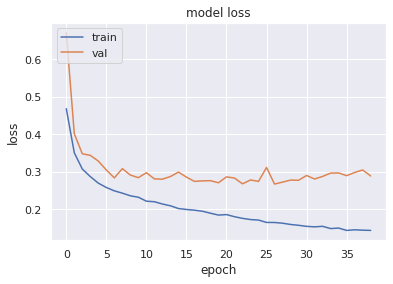

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

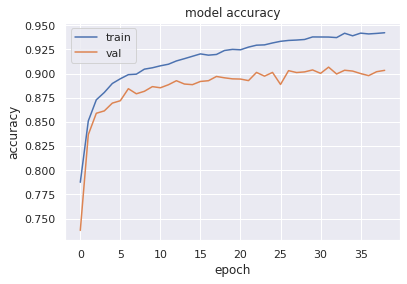

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
y_pred = model.predict(X_test)
y_pred = np.array(list(map(lambda x: 1 if x > 0.5 else 0, y_pred)))

0.909716176214522

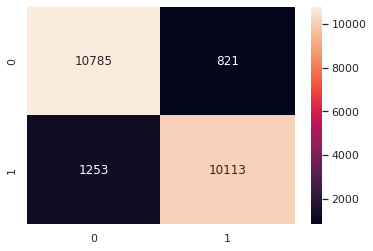

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, fmt='g', annot=True)
accuracy_score(y_test, y_pred)

# LogisticRegression

In [ ]:
lr = LogisticRegression(random_state=0)
lr.fit(X_train,y_train)
y_pred = lr.predict(X_test)

The accuraccy is:	 0.7460821870102734


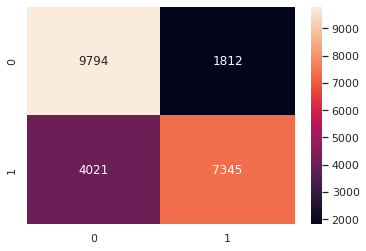

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, fmt='g', annot=True)
print('The accuraccy is:\t',accuracy_score(y_test, y_pred))

# XGBClassifier

In [ ]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric="logloss")
xgb.fit(X_train,y_train)
y_predx = xgb.predict(X_test)

The accuraccy is:	 0.9242991467873933


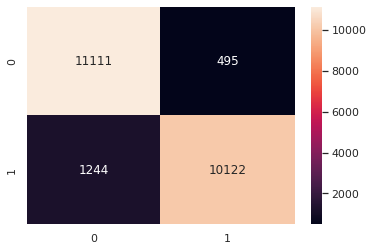

In [ ]:
cm = confusion_matrix(y_test, y_predx)
sns.heatmap(cm, fmt='g', annot=True)
print('The accuraccy is:\t',accuracy_score(y_test, y_predx))

## Classification Report for ANN


In [ ]:
target_names = ['no','yes']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

          no       0.90      0.93      0.91     11606
         yes       0.92      0.89      0.91     11366

    accuracy                           0.91     22972
   macro avg       0.91      0.91      0.91     22972
weighted avg       0.91      0.91      0.91     22972



# Classification Report for XGBClassifier

In [ ]:
target_names = ['no','yes']
print(classification_report(y_test, y_predx, target_names=target_names))

              precision    recall  f1-score   support

          no       0.90      0.96      0.93     11606
         yes       0.95      0.89      0.92     11366

    accuracy                           0.92     22972
   macro avg       0.93      0.92      0.92     22972
weighted avg       0.93      0.92      0.92     22972



# 2

In [ ]:
!pip install jupyter-dash -q
!pip install dash-cytoscape -q

     |████████████████████████████████| 7.3 MB 6.8 MB/s 
     |████████████████████████████████| 23.9 MB 73.3 MB/s 
     |████████████████████████████████| 357 kB 51.5 MB/s 
     |████████████████████████████████| 3.6 MB 5.1 MB/s 


In [ ]:
!pip install chart_studio

In [ ]:
from jupyter_dash import JupyterDash  # pip install dash
import dash_cytoscape as cyto  # pip install dash-cytoscape==0.2.0 or higher
import dash_html_components as html
import dash_core_components as dcc
from dash.dependencies import Output, Input
import pandas as pd  # pip install pandas
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
import math
import numpy as np
from dash import no_update

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  after removing the cwd from sys.path.


In [ ]:
# data = pd.read_csv('/content/bank-direct-marketing-campaigns.csv', sep=',')
data.head()

,age,job,marital,education,has_credit_card,housing,loan,contact,month,day_of_week,campaign,pdays,previous,prev_outcome,emp_var_rate,price_index,confidence_index,eur_3month,no_of_employees,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
px.histogram(data, x="y", color='y')

In [ ]:
fig = px.histogram(data, x="age", color="y")
fig.show()

In [ ]:
import plotly.graph_objects as go


fig = go.Figure()
fig.add_trace(go.Histogram(x=data[data['y']=='yes']['age'], name='yes'))  # , nbinsx=30
fig.add_trace(go.Histogram(x=data[data['y']=='no']['age'], name='no'))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [ ]:
fig = px.box(data, x="job", y="age")
fig.show()

In [ ]:
fig = px.box(data, x="job", y="age", color="y")
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=data[data['y']=='yes']['job'], name='yes'))
fig.add_trace(go.Histogram(x=data[data['y']=='no']['job'], name='no'))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='yes']['job'], name='yes'))
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='no']['job'], name='no'))

fig.show()

In [ ]:
marital_order = data[['marital', 'age']].groupby(by=['marital'], axis=0).mean().sort_values(by='age', ascending=True).index

plt.figure(figsize=(13, 12))
fig = px.strip(data, x="marital", y="age", color="marital")
fig.show()

<Figure size 936x864 with 0 Axes>

In [ ]:
fig = px.violin(data, x='marital', y='age', color='y')
fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Violin(x=data['marital'][ data['y'] == 'yes' ],
                        y=data['age'][ data['y'] == 'yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue')
             )
fig.add_trace(go.Violin(x=data['marital'][ data['y'] == 'no' ],
                        y=data['age'][ data['y'] == 'no' ],
                        legendgroup='No', scalegroup='No', name='No',
                        side='positive',
                        line_color='red')
             )
fig.update_traces(meanline_visible=True)
fig.update_layout(violingap=0, violinmode='overlay')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='yes']['marital'], name='yes'))
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='no']['marital'], name='no'))

fig.show()

In [ ]:
plt.figure(figsize=(13, 12))
fig = px.strip(data, x="education", y="age", color="education")
fig.show()

<Figure size 936x864 with 0 Axes>

In [ ]:
fig = go.Figure()

fig.add_trace(go.Violin(x=data['education'][ data['y'] == 'yes' ],
                        y=data['age'][ data['y'] == 'yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue')
             )
fig.add_trace(go.Violin(x=data['education'][ data['y'] == 'no' ],
                        y=data['age'][ data['y'] == 'no' ],
                        legendgroup='No', scalegroup='No', name='No',
                        side='positive',
                        line_color='red')
             )
fig.update_traces(meanline_visible=True)
fig.update_layout(violingap=0, violinmode='overlay')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='yes']['education'], name='yes'))
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='no']['education'], name='no'))

fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='yes']['has_credit_card'], name='yes'))
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='no']['has_credit_card'], name='no'))

fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='yes']['housing'], name='yes'))
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='no']['housing'], name='no'))

fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='yes']['loan'], name='yes'))
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='no']['loan'], name='no'))

fig.show()

<Figure size 1080x864 with 0 Axes>

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='yes']['contact'], name='yes'))
fig.add_trace(go.Histogram(histfunc="count",x=data[data['y']=='no']['contact'], name='no'))

fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=data[data['contact']=='telephone']['age'], name='telephone'))  # , nbinsx=30
fig.add_trace(go.Histogram(x=data[data['contact']!='telephone']['age'], name='cellular'))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

findfont: Font family ['San'] not found. Falling back to DejaVu Sans.


<Figure size 432x288 with 0 Axes>

In [ ]:
#data[(data['contact']=='telephone') & (data['y']=='yes')]['age']

fig = px.histogram(data, x="age", color="contact")
fig.show()